<a href="https://colab.research.google.com/github/shinebalance/DL_notes/blob/master/GDL_code_study/7_4~5_MuseGan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 7-3　MuseGANで作曲
* ポリフォニックな作曲をやってみよう
 * GPU使います

> [ChoasさんRepo](https://github.com/chaos44/generative_deep_learning/tree/main/chap7)を起点に編集

## 事前準備類

In [1]:
# tensorflow 2のブランチを指定して作者レポジトリをColabコンテナ内にクローン
!git clone -b tensorflow_2 https://github.com/davidADSP/GDL_code.git

Cloning into 'GDL_code'...
remote: Enumerating objects: 391, done.
remote: Total 391 (delta 0), reused 0 (delta 0), pack-reused 391
Receiving objects: 100% (391/391), 22.13 MiB | 36.91 MiB/s, done.
Resolving deltas: 100% (237/237), done.


In [2]:
# クローンしたディレクトリ内に移動
# %をつけてマジックコマンドとして実行する必要があるので注意(!だとサブプロセスの中でディレクトリが変わるだけ)
%cd GDL_code/

/content/GDL_code


In [3]:
# pip install --upgrade music21

In [4]:
from music21 import converter, chord, note

# 7-4 MuseGanのトレーニング

## **MuseGAN Training**
### **imports**
* [JSB-Chorales-dataset](https://github.com/czhuang/JSB-Chorales-dataset)バッハのデータセット？を使う
* 本来の手順では、https://github.com/czhuang/JSB-Chorales-dataset/blob/master/Jsb16thSeparated.npz　を/GDL_code/data/chorales/に入れてから実行

In [6]:
# データセットをwgetで任意のディレクトリにDLする
! wget https://github.com/czhuang/JSB-Chorales-dataset/raw/master/Jsb16thSeparated.npz -P "/content/GDL_code/data/chorales/"

--2021-01-10 23:14:01--  https://github.com/czhuang/JSB-Chorales-dataset/raw/master/Jsb16thSeparated.npz
Resolving github.com (github.com)... 140.82.114.4
Connecting to github.com (github.com)|140.82.114.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/czhuang/JSB-Chorales-dataset/master/Jsb16thSeparated.npz [following]
--2021-01-10 23:14:01--  https://raw.githubusercontent.com/czhuang/JSB-Chorales-dataset/master/Jsb16thSeparated.npz
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 102808 (100K) [application/octet-stream]
Saving to: ‘/content/GDL_code/data/chorales/Jsb16thSeparated.npz’

Jsb16thSeparated.np 100%[===================>] 100.40K  --.-KB/s    in 0.003s  

2021-01-10 23:14:01 (32.4 MB/s) 

In [7]:
import os
import matplotlib.pyplot as plt
import numpy as np
import types

from models.MuseGAN import MuseGAN
from utils.loaders import load_music


from music21 import midi
from music21 import note, stream, duration

In [8]:
# run params
SECTION = 'compose'
RUN_ID = '0017'
DATA_NAME = 'chorales'
FILENAME = 'Jsb16thSeparated.npz'
RUN_FOLDER = 'run/{}/'.format(SECTION)
RUN_FOLDER += '_'.join([RUN_ID, DATA_NAME])



if not os.path.exists(RUN_FOLDER):
    os.mkdir(RUN_FOLDER)
    os.mkdir(os.path.join(RUN_FOLDER, 'viz'))
    os.mkdir(os.path.join(RUN_FOLDER, 'images'))
    os.mkdir(os.path.join(RUN_FOLDER, 'weights'))
    os.mkdir(os.path.join(RUN_FOLDER, 'samples'))

mode =  'build' # ' 'load' #

### **data**

In [9]:
BATCH_SIZE = 64
n_bars = 2
n_steps_per_bar = 16
n_pitches = 84
n_tracks = 4

data_binary, data_ints, raw_data = load_music(DATA_NAME, FILENAME, n_bars, n_steps_per_bar)
data_binary = np.squeeze(data_binary)

### **architecture**

In [10]:
gan = MuseGAN(input_dim = data_binary.shape[1:]
        , critic_learning_rate = 0.001
        , generator_learning_rate = 0.001
        , optimiser = 'adam'
        , grad_weight = 10
        , z_dim = 32
        , batch_size = BATCH_SIZE
        , n_tracks = n_tracks
        , n_bars = n_bars
        , n_steps_per_bar = n_steps_per_bar
        , n_pitches = n_pitches
        )

if mode == 'build':
    gan.save(RUN_FOLDER)
else:                 
    gan.load_weights(RUN_FOLDER)

In [11]:
# テンポラルネットワーク(247-248ページ)
gan.chords_tempNetwork.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
temporal_input (InputLayer)  [(None, 32)]              0         
_________________________________________________________________
reshape (Reshape)            (None, 1, 1, 32)          0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 2, 1, 1024)        66560     
_________________________________________________________________
batch_normalization (BatchNo (None, 2, 1, 1024)        4096      
_________________________________________________________________
activation (Activation)      (None, 2, 1, 1024)        0         
_________________________________________________________________
conv2d_transpose_1 (Conv2DTr (None, 2, 1, 32)          32800     
_________________________________________________________________
batch_normalization_1 (Batch (None, 2, 1, 32)          128 

In [12]:
# 小節生成器(250ページ)
gan.barGen[0].summary()

Model: "model_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bar_generator_input (InputLa [(None, 128)]             0         
_________________________________________________________________
dense_2 (Dense)              (None, 1024)              132096    
_________________________________________________________________
batch_normalization_10 (Batc (None, 1024)              4096      
_________________________________________________________________
activation_10 (Activation)   (None, 1024)              0         
_________________________________________________________________
reshape_10 (Reshape)         (None, 2, 1, 512)         0         
_________________________________________________________________
conv2d_transpose_10 (Conv2DT (None, 4, 1, 512)         524800    
_________________________________________________________________
batch_normalization_11 (Batc (None, 4, 1, 512)         2048

In [13]:
# MuseGAN生成器(250〜251ページ)
gan.generator.summary()

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
melody_input (InputLayer)       [(None, 4, 32)]      0                                            
__________________________________________________________________________________________________
chords_input (InputLayer)       [(None, 32)]         0                                            
__________________________________________________________________________________________________
lambda (Lambda)                 (None, 32)           0           melody_input[0][0]               
__________________________________________________________________________________________________
lambda_1 (Lambda)               (None, 32)           0           melody_input[0][0]               
___________________________________________________________________________________________

In [14]:
# GAN評価器(252〜254ページ)
gan.critic.summary()

Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
critic_input (InputLayer)    [(None, 2, 16, 84, 4)]    0         
_________________________________________________________________
conv3d (Conv3D)              multiple                  1152      
_________________________________________________________________
leaky_re_lu (LeakyReLU)      multiple                  0         
_________________________________________________________________
conv3d_1 (Conv3D)            multiple                  16512     
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    multiple                  0         
_________________________________________________________________
conv3d_2 (Conv3D)            multiple                  196736    
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    multiple                  0     

### **training**

In [15]:
EPOCHS = 60
PRINT_EVERY_N_BATCHES = 10

gan.epoch = 0

In [16]:
gan.train(     
    data_binary
    , batch_size = BATCH_SIZE
    , epochs = EPOCHS
    , run_folder = RUN_FOLDER
    , print_every_n_batches = PRINT_EVERY_N_BATCHES
)

0 (5, 1) [D loss: (9.4)(R -0.5, F -0.0, G 1.0)] [G loss: -0.4]


/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


1 (5, 1) [D loss: (-225.6)(R -258.5, F -5.8, G 3.9)] [G loss: -48.9]
2 (5, 1) [D loss: (-327.6)(R -506.9, F -27.9, G 20.7)] [G loss: -177.4]
3 (5, 1) [D loss: (-332.7)(R -426.4, F -182.5, G 27.6)] [G loss: 330.2]
4 (5, 1) [D loss: (-302.7)(R -484.5, F -14.6, G 19.6)] [G loss: -231.9]
5 (5, 1) [D loss: (-227.6)(R -1442.4, F 657.9, G 55.7)] [G loss: -685.8]
6 (5, 1) [D loss: (-272.7)(R -928.6, F 530.7, G 12.5)] [G loss: -805.7]
7 (5, 1) [D loss: (-226.4)(R -929.7, F 560.8, G 14.2)] [G loss: -897.5]
8 (5, 1) [D loss: (-157.9)(R -894.5, F 622.5, G 11.4)] [G loss: -847.0]
9 (5, 1) [D loss: (-89.3)(R -782.8, F 631.9, G 6.2)] [G loss: -783.9]
10 (5, 1) [D loss: (-44.3)(R -629.2, F 568.9, G 1.6)] [G loss: -727.3]
11 (5, 1) [D loss: (-54.3)(R -630.0, F 566.5, G 0.9)] [G loss: -753.5]
12 (5, 1) [D loss: (-84.8)(R -927.1, F 819.4, G 2.3)] [G loss: -793.8]
13 (5, 1) [D loss: (-93.3)(R -859.0, F 678.8, G 8.7)] [G loss: -612.2]
14 (5, 1) [D loss: (-122.5)(R -968.3, F 783.6, G 6.2)] [G loss: -917.6]


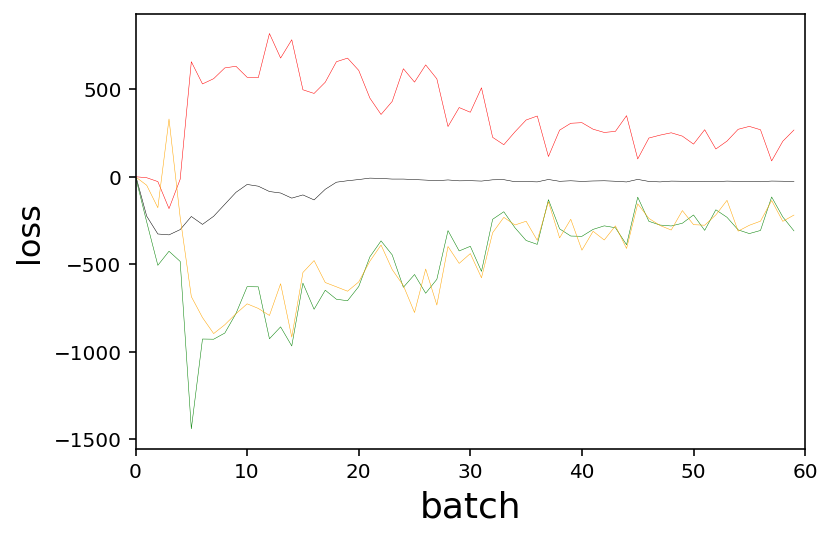

In [17]:
fig = plt.figure()
plt.plot([x[0] for x in gan.d_losses], color='black', linewidth=0.25)

plt.plot([x[1] for x in gan.d_losses], color='green', linewidth=0.25)
plt.plot([x[2] for x in gan.d_losses], color='red', linewidth=0.25)
plt.plot(gan.g_losses, color='orange', linewidth=0.25)

plt.xlabel('batch', fontsize=18)
plt.ylabel('loss', fontsize=16)

plt.xlim(0, len(gan.d_losses))
# plt.ylim(0, 2)

plt.show()

# 7-5

In [18]:
# import os
# import matplotlib.pyplot as plt
# import numpy as np

# from music21 import midi
# from music21 import note, stream, duration
from music21 import converter

from models.MuseGAN import MuseGAN

from utils.loaders import load_music

from tensorflow.keras.models import load_model

In [23]:
# run params
# SECTION = 'compose'
# RUN_ID = '001'
# DATA_NAME = 'chorales'
# FILENAME = 'Jsb16thSeparated.npz'
# RUN_FOLDER = 'run/{}/'.format(SECTION)
# RUN_FOLDER += '_'.join([RUN_ID, DATA_NAME])


# run params  7-4で動かしたモデルを使うならこっち
SECTION = 'compose'
RUN_ID = '0017'
DATA_NAME = 'chorales'
FILENAME = 'Jsb16thSeparated.npz'
RUN_FOLDER = 'run/{}/'.format(SECTION)
RUN_FOLDER += '_'.join([RUN_ID, DATA_NAME])

## data

In [24]:
BATCH_SIZE = 64
n_bars = 2
n_steps_per_bar = 16
n_pitches = 84
n_tracks = 4

data_binary, data_ints, raw_data = load_music(DATA_NAME, FILENAME, n_bars, n_steps_per_bar)
# data_binary = np.squeeze(data_binary)

In [25]:
gan = MuseGAN(input_dim = data_binary.shape[1:]
        , critic_learning_rate = 0.001
        , generator_learning_rate = 0.001
        , optimiser = 'adam'
        , grad_weight = 10
        , z_dim = 32
        , batch_size = BATCH_SIZE
        , n_tracks = n_tracks
        , n_bars = n_bars
        , n_steps_per_bar = n_steps_per_bar
        , n_pitches = n_pitches
        )



In [26]:
gan.load_weights(RUN_FOLDER, None)

In [27]:
gan.generator.summary()

Model: "model_36"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
melody_input (InputLayer)       [(None, 4, 32)]      0                                            
__________________________________________________________________________________________________
chords_input (InputLayer)       [(None, 32)]         0                                            
__________________________________________________________________________________________________
lambda_42 (Lambda)              (None, 32)           0           melody_input[0][0]               
__________________________________________________________________________________________________
lambda_43 (Lambda)              (None, 32)           0           melody_input[0][0]               
___________________________________________________________________________________________

In [28]:
gan.critic.summary()

Model: "model_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
critic_input (InputLayer)    [(None, 2, 16, 84, 4)]    0         
_________________________________________________________________
conv3d_16 (Conv3D)           multiple                  1152      
_________________________________________________________________
leaky_re_lu_18 (LeakyReLU)   multiple                  0         
_________________________________________________________________
conv3d_17 (Conv3D)           multiple                  16512     
_________________________________________________________________
leaky_re_lu_19 (LeakyReLU)   multiple                  0         
_________________________________________________________________
conv3d_18 (Conv3D)           multiple                  196736    
_________________________________________________________________
leaky_re_lu_20 (LeakyReLU)   multiple                  0  

# view sample score

In [29]:
chords_noise = np.random.normal(0, 1, (1, gan.z_dim))
style_noise = np.random.normal(0, 1, (1, gan.z_dim))
melody_noise = np.random.normal(0, 1, (1, gan.n_tracks, gan.z_dim))
groove_noise = np.random.normal(0, 1, (1, gan.n_tracks, gan.z_dim))

In [30]:
gen_scores = gan.generator.predict([chords_noise, style_noise, melody_noise, groove_noise])

/usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training.py:2325: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [31]:
np.argmax(gen_scores[0,0,0:4,:,3], axis = 1)

array([52, 53, 50, 55])

In [32]:
gen_scores[0,0,0:4,60,3] = 0.02347812

In [37]:
filename = 'example'
gan.notes_to_midi(RUN_FOLDER, gen_scores, filename)
gen_score = converter.parse(os.path.join(RUN_FOLDER, 'samples/{}.midi'.format(filename)))
# gen_score.show()  # MuseScoreが上手く動かないので出ない
gen_score.show('text')

{0.0} <music21.stream.Part 0x7f4d713ca5c0>
    {0.0} <music21.tempo.MetronomeMark adagietto Quarter=66.0>
    {0.0} <music21.note.Note A>
    {0.25} <music21.note.Note C>
    {0.5} <music21.note.Note B>
    {0.75} <music21.note.Note C>
    {1.0} <music21.note.Note A>
    {1.25} <music21.note.Note C>
    {1.5} <music21.note.Note B>
    {1.75} <music21.note.Note C>
    {2.0} <music21.note.Note A>
    {2.25} <music21.note.Note C>
    {2.5} <music21.note.Note B>
    {2.75} <music21.note.Note C>
    {3.0} <music21.note.Note A>
    {3.25} <music21.note.Note C>
    {3.5} <music21.note.Note B>
    {3.75} <music21.note.Note C>
    {4.0} <music21.note.Note A>
    {4.25} <music21.note.Note C>
    {4.5} <music21.note.Note B>
    {4.75} <music21.note.Note C>
    {5.0} <music21.note.Note A>
    {5.25} <music21.note.Note C>
    {5.5} <music21.note.Note B>
    {5.75} <music21.note.Note C>
    {6.0} <music21.note.Note A>
    {6.25} <music21.note.Note C>
    {6.5} <music21.note.Note B>
    {6.75} <music

In [40]:
# 落として聞いてみよう
! ls /content/GDL_code/run/compose/0017_chorales/samples/*.midi
# DLが走るセル
from google.colab import files
# files.download('実行結果のパスを入れる')
files.download('/content/GDL_code/run/compose/0017_chorales/samples/example.midi')

/content/GDL_code/run/compose/0017_chorales/samples/example.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_0_0.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_0_1.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_0_2.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_0_3.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_0_4.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_10_0.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_10_1.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_10_2.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_10_3.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_10_4.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_20_0.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_20_1.midi
/content/GDL_code/run/compose/0017_chorales/samples/sample_20_2.midi
/content/GDL_code/run/compose/0017_chorales

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

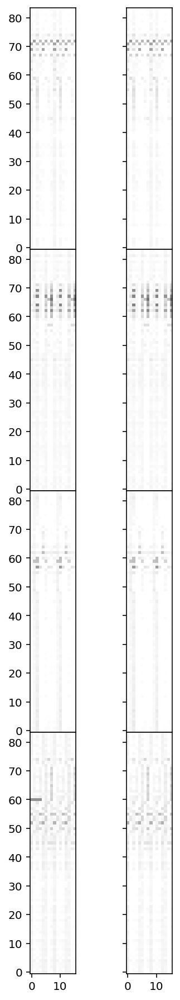

In [35]:
gan.draw_score(gen_scores, 0)

### MIDIをWAVに変換して聞く方法があるので、聴き比べに是非
* 引用元：https://qiita.com/NoriakiOshita/items/7696ce5fa42d4cc02b0c

In [ ]:
# フリーのシンセサイザーをインストールする
!apt install fluidsynth
!cp /usr/share/sounds/sf2/FluidR3_GM.sf2 ./font.sf2
# MIDI2AUDIOを導入
!pip install midi2audio

In [85]:
# 変換するファイルを指定
INPUT_MIDI = '/content/GDL_code/run/compose/0017_chorales/samples/example.midi'

# 初回のみ実行が必要
from midi2audio import FluidSynth
from IPython.display import Audio

## サウンドフォントを指定する
fs = FluidSynth(sound_font='font.sf2')
## 入力するmidiファイルとアウトプットファイル
fs.midi_to_audio(INPUT_MIDI, 'output.mp3')
# IPythonのアウトプットにmp3を出力
Audio('output.mp3')


# find the closest match

In [41]:
def find_closest(data_binary, score):
    current_dist = 99999999
    current_i = -1
    for i, d in enumerate(data_binary):
        dist = np.sqrt(np.sum(pow((d - score),2)))
        if dist < current_dist:
            current_i = i
            current_dist = dist
        
    return current_i
    

In [42]:
closest_idx = find_closest(data_binary, gen_scores[0])
closest_data = data_binary[[closest_idx]]
print(closest_idx)

34


In [45]:
filename = 'closest'
gan.notes_to_midi(RUN_FOLDER, closest_data,filename)
closest_score = converter.parse(os.path.join(RUN_FOLDER, 'samples/{}.midi'.format(filename)))
# print('original')
# gen_score.show()  # MuseScoreが上手く動かないので出ない
# print('closest')
# closest_score.show()  # MuseScoreが上手く動かないので出ない

original
closest


In [86]:
# 変換するファイルを指定
INPUT_MIDI = '/content/GDL_code/run/compose/0017_chorales/samples/closest.midi'

# 初回のみ実行が必要
# from midi2audio import FluidSynth
# from IPython.display import Audio

## サウンドフォントを指定する
fs = FluidSynth(sound_font='font.sf2')
## 入力するmidiファイルとアウトプットファイル
fs.midi_to_audio(INPUT_MIDI, 'output.mp3')
# IPythonのアウトプットにmp3を出力
Audio('output.mp3')


(こっちのほうが綺麗な旋律のような気がする)

# changing the chords noise

In [48]:
chords_noise_2 = 5 * np.ones((1, gan.z_dim))

In [49]:
chords_scores = gan.generator.predict([chords_noise_2, style_noise, melody_noise, groove_noise])

In [79]:
filename = 'changing_chords'
gan.notes_to_midi(RUN_FOLDER, chords_scores, filename)
chords_score = converter.parse(os.path.join(RUN_FOLDER, 'samples/{}.midi'.format(filename)))
# print('original')
# gen_score.show()  # MuseScoreが上手く動かないので出ない
# print('closest')
# closest_score.show()  # MuseScoreが上手く動かないので出ない

In [88]:
# 変換するファイルを指定
INPUT_MIDI = '/content/GDL_code/run/compose/0017_chorales/samples/changing_chords.midi'

# 初回のみ実行が必要
# from midi2audio import FluidSynth
# from IPython.display import Audio

## サウンドフォントを指定する
fs = FluidSynth(sound_font='font.sf2')
## 入力するmidiファイルとアウトプットファイル
fs.midi_to_audio(INPUT_MIDI, 'output.mp3')
# IPythonのアウトプットにmp3を出力
Audio('output.mp3')


# changing the style noise

In [90]:
style_noise_2 = 5 * np.ones((1, gan.z_dim))

In [91]:
style_scores = gan.generator.predict([chords_noise, style_noise_2, melody_noise, groove_noise])

In [92]:
filename = 'changing_style'
gan.notes_to_midi(RUN_FOLDER, style_scores, filename)
style_score = converter.parse(os.path.join(RUN_FOLDER, 'samples/{}.midi'.format(filename)))
# print('original')
# gen_score.show()  # MuseScoreが上手く動かないので出ない
# print('closest')
# closest_score.show()  # MuseScoreが上手く動かないので出ない

In [93]:
# 変換するファイルを指定
INPUT_MIDI = '/content/GDL_code/run/compose/0017_chorales/samples/changing_style.midi'

# 初回のみ実行が必要
# from midi2audio import FluidSynth
# from IPython.display import Audio

## サウンドフォントを指定する
fs = FluidSynth(sound_font='font.sf2')
## 入力するmidiファイルとアウトプットファイル
fs.midi_to_audio(INPUT_MIDI, 'output.mp3')
# IPythonのアウトプットにmp3を出力
Audio('output.mp3')


# changing the melody noise

In [94]:
melody_noise_2 = np.copy(melody_noise)
melody_noise_2[0,0,:] = 5 * np.ones(gan.z_dim) 

In [95]:
melody_scores = gan.generator.predict([chords_noise, style_noise, melody_noise_2, groove_noise])

In [96]:
filename = 'changing_melody'
gan.notes_to_midi(RUN_FOLDER, melody_scores, filename)
melody_score = converter.parse(os.path.join(RUN_FOLDER, 'samples/{}.midi'.format(filename)))
# print('original')
# gen_score.show()  # MuseScoreが上手く動かないので（略
# print('closest')
# closest_score.show()  # MuseScoreが上手く動かないので（略

In [98]:
# 変換するファイルを指定
INPUT_MIDI = '/content/GDL_code/run/compose/0017_chorales/samples/changing_melody.midi'

# 初回のみ実行が必要
# from midi2audio import FluidSynth
# from IPython.display import Audio

## サウンドフォントを指定する
fs = FluidSynth(sound_font='font.sf2')
## 入力するmidiファイルとアウトプットファイル
fs.midi_to_audio(INPUT_MIDI, 'output.mp3')
# IPythonのアウトプットにmp3を出力
Audio('output.mp3')


# changing the groove noise

In [100]:
groove_noise_2 = np.copy(groove_noise)
groove_noise_2[0,3,:] = 5 * np.ones(gan.z_dim)

In [101]:
groove_scores = gan.generator.predict([chords_noise, style_noise, melody_noise, groove_noise_2])

In [102]:
filename = 'changing_groove'
gan.notes_to_midi(RUN_FOLDER, groove_scores, filename)
groove_score = converter.parse(os.path.join(RUN_FOLDER, 'samples/{}.midi'.format(filename)))
# print('original')
# gen_score.show()  # MuseScoreが上手く動かないので（略
# print('closest')
# closest_score.show()  # MuseScoreが上手く動かないので（略

In [103]:
# 変換するファイルを指定
INPUT_MIDI = '/content/GDL_code/run/compose/0017_chorales/samples/changing_groove.midi'

# 初回のみ実行が必要
# from midi2audio import FluidSynth
# from IPython.display import Audio

## サウンドフォントを指定する
fs = FluidSynth(sound_font='font.sf2')
## 入力するmidiファイルとアウトプットファイル
fs.midi_to_audio(INPUT_MIDI, 'output.mp3')
# IPythonのアウトプットにmp3を出力
Audio('output.mp3')


# 以上